#  [Lighthouse] Desafio Cientista de Dados 2025.3

## Previsão de preços de imóveis (Nova York)

### Sobre este projeto

Autor:**[Jorge Luiz Figueira da Silva Junior](https://www.linkedin.com/in/jorgeluizfigueira/)** 

Este projeto é um desafio que consiste em avaliar os conhecimentos sobre a resolução de problemas de negócios, análises de dados e aplicação de modelos preditivos.

O projeto faz parte do processo seletivo **[Lighthouse](https://www.indicium.tech/pt-br/sobre-nos/carreiras)**, um programa da **Indicium** para estudantes e profissionais em transição de carreira para a área de dados.

Por se tratar de um **projeto de mineração e análise de dados**, julgou-se apropriado adotar a metodologia *Cross-Industry Standard Process for Data Mining (CRISP-DM)* para condução do desafio. 

O CRISP-DM consiste em um **framework** de boas práticas para projetos de análise de dados. Por fornecer uma abordagem sistemática, a metodologia garante que todos os aspectos relevantes sejam considerados. Ele nos ajuda a compreender os desafios de negócio, explorar os dados, desenvolver modelos eficazes e implementar soluções que melhorem o **core business**, em nosso caso, a **precificação de imóveis**. 

Abaixo encontra-se uma figura que ilustra as etapas do framework, as quais serão detalhadas nas seções seguintes.


<img src="../images/framework-crispdm.png" alt="FIGURA - Etapas do modelo CRISP-DM" style="width:400px;height:400px;">




## 01. Entendimento do Negócio (Business Understanding)

A primeira etapa do CRISP-DM é o Entendimento do Negócio. Nesta etapa, o objetivo é entender as necessidades do cliente e os objetivos do projeto. 

Nosso cliente é uma empresa que planeja **desenvolver uma plataforma de alugueis temporários** na cidade de Nova York.

A empresa comprou uma base de dados de um concorrente para entender melhor o mercado e precificar seus imóveis de forma mais competitiva. 

Nosso **objetivo** é analisar os dados para responder às perguntas de negócios feitas pelo cliente, responder demais hipóteses que se fazerem pertinentes e **criar um modelo preditivo** que **precifique imóveis** de forma que fiquem mais próximos dos valores praticados no mercado.**

**A ciência de dados** pode **contribuir com setor imobiliário** ajudando a precificar melhor os preços dos imoveís contribuindo com a competitividade, identicar regiões onde é promissor investir, entender melhor as preferências de seu público e oferecer as opções que mais se adequem às suas necessidades (e.g. Sistemas de Recomendação)

## 02. Entendimento dos Dados (Data Understanding)
Objetivo: Explorar os dados disponíveis para adquirir conhecimento sobre o conjunto de dados.

Tarefas:

- Descrição dos dados
- Verificação de itens duplicados
- Remoção de variaveis não relevantes
- Resumo Estatístico
- Análise Exploratória dos dados
    - Visualização dos dados
    - Explorar Correlações
    - Responder perguntas de négocio
    - Levantar e testar hipóteses

### Dicionário dos dados

Os nomes das variáveis são auto-explicativos, contudo é fornecido abaixo uma tabela com as descrições.

| Nome da Variável                  | Descrição                                                                 |
|-----------------------------------|---------------------------------------------------------------------------|
| `id`                              | Chave única para cada anúncio.                                            |
| `nome`                            | Nome do anúncio.                                                         |
| `host_id`                         | Identificador do usuário que hospedou o anúncio.                         |
| `host_name`                       | Nome do usuário que hospedou o anúncio.                                  |
| `bairro_group`                    | Nome do grupo de bairros onde o anúncio está localizado.                 |
| `bairro`                          | Nome da área específica onde o anúncio está localizado.                  |
| `latitude`                        | Latitude do local do anúncio.                                            |
| `longitude`                       | Longitude do local do anúncio.                                           |
| `room_type`                       | Tipo de acomodação oferecida no anúncio (e.g., quarto privado, inteiro). |
| `price`                           | Preço por noite (em dólares).                                            |
| `minimo_noites`                   | Número mínimo de noites que o usuário deve reservar.                     |
| `numero_de_reviews`               | Número total de avaliações recebidas pelo anúncio.                       |
| `ultima_review`                   | Data da última avaliação recebida.                                       |
| `reviews_por_mes`                 | Número médio de avaliações por mês.                                      |
| `calculado_host_listings_count`   | Quantidade de anúncios do mesmo anfitrião.                               |
| `disponibilidade_365`             | Número de dias em que o anúncio está disponível para reserva no ano.     |


#### Importação das bibliotecas necessárias

In [1]:
# Manipulação de Dados
import pandas as pd
import numpy as np
import pickle

# Visualização dos Dados
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from wordcloud import WordCloud, ImageColorGenerator
from PIL import Image

# Processamento de Dados Geográficos
from geopy.distance import geodesic

# Processamento de Linguagem Natural
import re
import nltk
from nltk.corpus import stopwords

# Modelagem e Avaliação
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.preprocessing import RobustScaler

In [2]:
#carregando a base de dados
imoveis = pd.read_csv('../data/teste_indicium_precificacao.csv')

In [3]:
# Tamanho do dataset
print(f'Total de instâncias do dataset: {imoveis.shape[0]} e o total de colunas é: {imoveis.shape[1]}')

Total de instâncias do dataset: 48894 e o total de colunas é: 16


In [4]:
#Vamos verificar valores ausentes
imoveis.isnull().sum()

id                                   0
nome                                16
host_id                              0
host_name                           21
bairro_group                         0
bairro                               0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimo_noites                        0
numero_de_reviews                    0
ultima_review                    10052
reviews_por_mes                  10052
calculado_host_listings_count        0
disponibilidade_365                  0
dtype: int64

#### Primeiros comentários

A maioria das variáveis estão preenchidas. 

As variáveis ultima_review e reviews_por_mes possuem um valor expressivo e identicos de dados ausentes. Podemos inferir que esses imóveis podem ser recentes na plataforma  e por essa razão não possuirem a data de última avaliação.

Podemos tratar a variável "reviews_por_mes" preenchendo com o valor zero.

In [5]:
imoveis['reviews_por_mes'].fillna(0, inplace=True)

#### Verificação de itens duplicados

Por meio da variavel "id" identificou-se que temos instâncias únicas

In [6]:
print(f"Total de instâncias duplicadas: {imoveis['id'].duplicated().sum()}")

Total de instâncias duplicadas: 0


### Imóvel de Avaliação

Ao final do projeto, utilizaremos as características do imóvel com ID 2595 (detalhes abaixo) para estimar o valor da diária (price) com o modelo treinado. 

Para garantir que o modelo não tenha acesso a essas informações durante o treinamento e possamos obter um resultado mais próximo de um cenário real, removeremos esse imóvel do conjunto de dados antes do treinamento. 

Essa abordagem evita que o modelo "veja" os dados do imóvel durante o treino, assegurando uma avaliação mais precisa e imparcial de sua capacidade preditiva.

In [7]:
imoveis[imoveis['id'] == 2595]

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355


In [8]:
imoveis = imoveis[imoveis['id'] != 2595]

#### Remoção de variáveis menos relevantes

Por meio da variável de "id" temos que nosso conjunto possui instâncias únicas, tornando-a descartavel. 
A variável "host_name" seria o nome do proprietário do imóvel, um dado considerado sensível, portanto iremos também descarta-la.

Embora este seja apenas um exercício prático, num cenário real são empregas técnicas mais sofisticadas.

In [9]:
# Removemos as colunas "id" e "host_name" do datafreme
imoveis.drop(['id', 'host_name',], axis=1, inplace=True)

In [10]:
# Vamos olhar como os dados "se parecem", visualizando o dataframe com dados aleatórios
imoveis.sample(3)

,nome,host_id,bairro_group,bairro,latitude,longitude,room_type,price,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
27464,Lovely two bedroom apartment in Manhattan NYC,151454628,Manhattan,Washington Heights,40.84482,-73.94029,Entire home/apt,139,2,85,2019-06-21,4.21,1,125
18565,Bright and clean room in a quaint neighborhood,515095,Brooklyn,Carroll Gardens,40.67954,-73.99935,Private room,100,2,93,2019-06-23,2.78,2,74
2626,Positive Cozy Room!,7475363,Manhattan,Upper East Side,40.76723,-73.95510,Private room,111,2,77,2019-06-17,1.10,2,259


### Resumo Estatístico

Nessa seção é feita a análise das principais estatísticas descritivas da base de dados.


Ao realizar a análise de estatísticas descritivas podemos computar a média, mediana, desvio padrão, valores extremos (mínimo, máximo) e quartis para **variáveis numéricas**. Para **variáveis categóricas** podemos calcular as contagens e as principais categorias para cada variável.
    
Isso foi feito facilmente utilizando o médodo *describe()* do pandas.

A **análise das estátisticas da variáveris numéricas** fornece uma visão geral da distribuição dos dados, sua dispersão e tendências centrais. Essas informações podem ajudar entender a variação dos preços dos imóveis, identificar possíveis padrões bem com identificação de discrepâncias.


Para as **categóricas**, a escolha das estatísticas como contagem e principais categorias, é útil pois nos ajudam a identificar as categorias mais comuns. Isso pode ser relevante para entender a diversidade de bairros, tipo de imoveis, etc., e como essas categorias podem influenciar o processo de precificação.


Em resumo, essa análise descritiva inicial é fundamental para obter insights sobre os dados, identificar possíveis problemas e guiar as etapas subsequentes do projeto.

#### Variáveis Numéricas

In [11]:
# Optou-se não considerar as variaveis host_id, latitude e longitide nessa estatística
# embora sejam númericas, elas possuem um outro entedimento e intepretação.

variaveis_num = ["price","minimo_noites","numero_de_reviews","reviews_por_mes",
                 "calculado_host_listings_count","disponibilidade_365"]

imoveis[variaveis_num].describe(include='number').round(2)

,price,minimo_noites,numero_de_reviews,reviews_por_mes,calculado_host_listings_count,disponibilidade_365
count,48893.00,48893.00,48893.00,48893.00,48893.00,48893.00
mean,152.72,7.03,23.27,1.09,7.14,112.77
std,240.16,20.51,44.55,1.60,32.95,131.62
min,0.00,1.00,0.00,0.00,1.00,0.00
25%,69.00,1.00,1.00,0.04,1.00,0.00
50%,106.00,3.00,5.00,0.37,1.00,45.00
75%,175.00,5.00,24.00,1.58,2.00,227.00
max,10000.00,1250.00,629.00,58.50,327.00,365.00


#### Comentários:
Antes de iniciar os comentários, uma breve revisão para quem não é familiarizado com conceitos de estatística.

A **média** (*mean*) é a média aritmética simples e deve ser analisada com muito cuidado, pois nem sempre reflete a realidade, especialmente se os dados da amostra forem muito dispersos. É nesse contexto que entra o **desvio padrão** (*std*), que mostra como os dados se dispersam em relação à média, ou seja, o quanto os dados estão espalhados.

**Valores extremos** (*min* e *max*) ajudam a identificar a amplitude da amostra, indicando o valor mais baixo e o valor mais alto entre todos os valores de uma determinada variável.

**Quartis** (25%, 50% e 75%):
- O primeiro quartil (*Q1*), também conhecido como quartil inferior, representa o valor abaixo do qual 25% dos valores estão localizados.  
- O segundo quartil (*Q2*), também conhecido como mediana ou quartil médio, divide os dados em duas partes iguais, com 50% dos valores abaixo e 50% acima.  
- O terceiro quartil (*Q3*), também chamado de quartil superior, indica o valor abaixo do qual 75% dos valores estão localizados.

---

### **Principais *insights***  


1. **Preço por noite** (*price*):  
   - Preço médio dos imóveis: **\$153,72 dólares**.  
   - Alto desvio padrão indica grande variação nos preços.  
   - Metade dos anúncios possui valor abaixo de **\$106**, o que mostra que a média é influenciada pelos valores mais altos.  
   - Metade dos imóveis está na faixa de **\$69** a **\$175 por noite**.  
   - Valores extremos: diárias de **\$0** (potencialmente inválidas) e imóveis que podem custar (diária) até **\$10.000**.

2. **Número mínimo de noites** (*minimo_noites*):  
   - Estadia mínima média: **7 noites**.  
   - Mediana (*Q2*): Maioria dos imóveis exige **3 noites ou menos**.  
   - Valor máximo de **1250 noites** indica presença de *outliers*.

3. **Número de avaliações** (*numero_de_reviews*):  
   - Metade dos anúncios possui menos avaliações do que a média.  
   - Valores extremos indicam anúncios sem avaliações e outros com muitas.  

4. **Média de avaliações por mês** (*reviews_por_mes*):  
   - Média: **1,09 avaliações por mês**.  
   - Mediana: metade dos anúncios recebe **1 avaliação por mês**.  
   - Valores extremos indicam que alguns anúncios têm avaliações significativamente altas.  
   
      - **Hipóteses:** 
          - Combinando esta variável com a anterior podemos estimar o tempo em que um imóvel está na plataforma. Será que existe uma diferença de preços entres imóveis cadastrados mais recentes e mais antigos ?
          - A popularidade (*reviews_por_mes*) impacta no preço?
          - Por meio dessa taxa, quais bairros recebem mais hóspedes?

5. **Anúncios por anfitrião** (*calculated_host_listings_count*):  
   - Metade dos proprietários possui **1 anúncio** (mediana - *Q2*).  
   - Em média, cada proprietário tem **7 anúncios**.  
   - Valores extremos mostram que alguns proprietários possuem centenas de imóveis.  
   
   
   - **Hipótese:** Grupos de pequenos e grandes proprietários possuem preços diferentes? 

6. **Disponibilidade por ano** (*disponibilidade_365*):  
   - Mediana (*Q2*): metade dos imóveis tem disponibilidade inferior a **45 dias**.     
   

#### Variáveis Categóricas


In [12]:
imoveis.describe(exclude='number')

,nome,bairro_group,bairro,room_type,ultima_review
count,48877,48893,48893,48893,38841
unique,47903,5,221,3,1764
top,Hillside Hotel,Manhattan,Williamsburg,Entire home/apt,2019-06-23
freq,18,21660,3920,25408,1413




### Principais insights

- **Manhattan** é o distrito mais frequente, concentrando cerca de 44% (21661) dos imóveis.
- **Casa/Apartamentos inteiros** representam o tipo de imóvel mais comum, com 52% (25409) das ofertas.
- **Williamsburg** é o bairro com mais imóveis cadastrados, representando 8% (3920) do total.

Manhattam é uma grande área, um distrito que possui características "premium".
Apartamentos inteiros geralmente têm valores mais altos.
Portanto a alta concentração de imóveis em Manhattan e a predominância podem ser determinantes no preço.

"Dando" um breve Google encontramos que: "Williamsburg é uma área descolada no Brooklyn que atrai os jovens e modernos para suas butiques chiques, bares descolados e restaurantes agitados."

Podemos inferir que alguns bairros vão proporcionar um estilo de vida mais boêmios que outros isso pode refletir na **valorização e preço dos imóveis**.


Além disso, o fato de Manhattan representar quase que metade os imóveis do dataset pode gerar um modelo desbalanceado. Esse viés pode dificultar a generalização do modelo para outras regiões menos representadas.

### Remoção de Instâncias com preço igual a zero

In [13]:
print(f"Imóveis com preço igual a zero: {len(imoveis[imoveis['price'] == 0])}")
# Remove instâncias com preço igual a zero
imoveis = imoveis[imoveis['price'] > 0]
imoveis.shape

Imóveis com preço igual a zero: 11


(48882, 14)

### Análise Exploratória dos Dados (EDA)

Nesta seção, iremos complementar a análise das estatíticas por meio de gráficos de histogramas e boxplot para entender melhor como esses dados estão distribuídos, sua dispersão bem como a identificação de pontos que merecem uma investigação mais detalhada.

Também avaliamos a correlação dessas variáveis com a variável preço. Visualizamos a distribuição dos categóricos.

Explorar outras características que podem ser computadas das variáveis atuais.

Vamos também responder as seguintes **perguntas de negócio**:

- P1: Supondo que uma pessoa esteja pensando em investir em um apartamento para alugar na plataforma, onde seria mais indicada a compra?

- P2: O número mínimo de noites e a disponibilidade ao longo do ano interferem no preço?

- P3:Existe algum padrão no texto do nome do local para lugares de mais alto valor?


Além disso, formulamos para validação **três hipóteses**:

- H1: A popularidade (reviews) impacta no preço?

- H2: Quais bairros possuem mais locação?

- H3: Qual o períódo Nova York recebeu mais hóspedes no contexto da nossa base de dados?

In [14]:
def histograma_boxplot(dados, coluna):
    """
    Exibe histograma e boxplot para uma variável numérica.
    """
    sns.set_theme(style="whitegrid")
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    
    sns.histplot(dados[coluna], kde=True, bins=20, color='skyblue', ax=ax1)
    ax1.set_title(f'Distribuição de {coluna}')
    ax1.set_xlabel(coluna)
    ax1.set_ylabel('Frequência')
    
    sns.boxplot(x=dados[coluna], color='lightcoral', ax=ax2)
    ax2.set_title(f'Boxplot de {coluna}')
    ax2.set_xlabel(coluna)
    
    plt.tight_layout()
    plt.show()

In [15]:
def grafico_barras(dados, coluna, max_categorias=10):
    """
    Plota um gráfico de barras mostrando as principais categorias de uma variável categórica.
    
    Parâmetros:
    - dados: DataFrame com os dados.
    - coluna: Nome da variável categórica a ser analisada.
    - max_categorias: Número máximo de categorias a serem exibidas (padrão: 10).
    """
    # Conta as ocorrências das categorias mais frequentes
    contagem = dados[coluna].value_counts().head(max_categorias)

    # Calcula os percentuais
    percentuais = (contagem / len(dados) * 100).round(2)

    # Configura o gráfico
    plt.figure(figsize=(8, 6))
    ax = contagem.plot(kind='bar', color='royalblue')

    # Títulos e rótulos
    plt.xlabel(coluna)
    plt.ylabel('Frequência')
    plt.title(f'Distribuição das principais categorias em "{coluna}"', fontsize=14)
    plt.xticks(rotation=45)

    # Adiciona percentuais nas barras
    for i, valor in enumerate(contagem):
        ax.text(i, valor + 2, f'{percentuais[i]}%', ha='center', fontsize=10)

    # Remove bordas desnecessárias
    sns.despine(left=False, bottom=False)

    # Ajusta o layout e exibe o gráfico
    plt.tight_layout()
    plt.show()

In [16]:
def scatterplot(dados, x, y):
    """
    Plota um gráfico de dispersão (scatterplot) com uma linha de tendência para duas variáveis.

    Parâmetros:
    - dados: DataFrame com os dados.
    - x: Nome da coluna para o eixo X.
    - y: Nome da coluna para o eixo Y.
    """
    # Extrai os dados das colunas x e y
    x_data = dados[x]
    y_data = dados[y]

    # Calcula os coeficientes da linha de tendência (reta de ajuste linear)
    coeficientes = np.polyfit(x_data, y_data, 1)
    linha_tendencia = np.poly1d(coeficientes)

    # Configura o gráfico de dispersão
    plt.figure(figsize=(10, 6))
    plt.scatter(x_data, y_data, label='Dados', color='b')
    plt.plot(x_data, linha_tendencia(x_data), label='Linha de Tendência', color='r')

    # Adiciona título e rótulos aos eixos
    plt.title(f'Relação entre {x} e {y}')
    plt.xlabel(x)
    plt.ylabel(y)

    # Adiciona legenda
    plt.legend()

    # Exibe o gráfico
    plt.tight_layout()
    plt.show()


### Distribuição variável 'price'

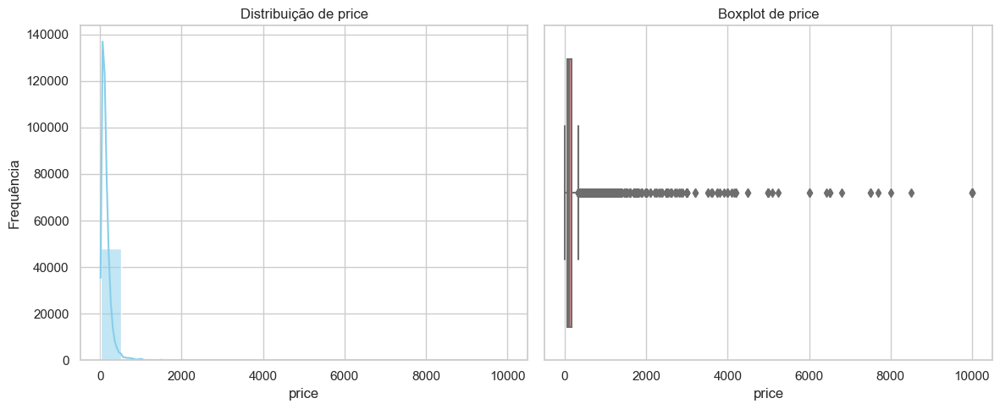

In [17]:
histograma_boxplot(dados=imoveis,coluna='price')

**Grande concentrações de imóveis com valores baixos**. Isso é indicado pela alta frequência próxima de zero indica  e uma queda acentuada à medida que os preços aumentam. Como também pela parte central do boxplot, concentrada num intervalo mais baixo.

Percebe-se muitos pontos acima do limite superior do boxplot(outliers), mostrando que há valores atípicos consideráveis, com preços bem mais altos que o intervalo interquartil.

Há imóveis com preços muito mais altos que a média, o que pode indicar propriedades de luxo ou "premium"

### Distribuição variável 'minimo_noites'

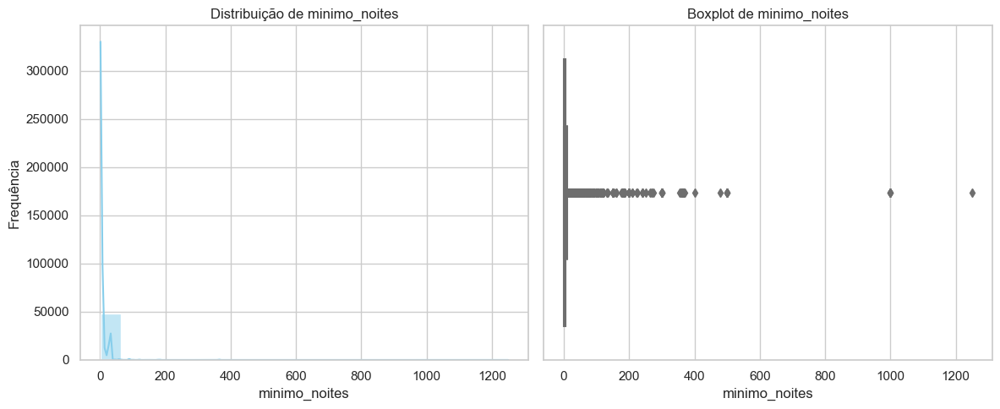

In [18]:
histograma_boxplot(dados=imoveis,coluna='minimo_noites')

Os gráficos de distribuição dos valores de "minimo_noites" nos trazem observações muito semelhantes feitas na variável anterior. Pelo histograma, a maioria dos valores está concentrada em valores baixos próxima de zero. **A maioria dos imóveis exigem uma estadia mínima curta**

No boxplot é destacado que há alguns valores que se estendem até 1200 noites. **Embora poucos, existem imóveis que exigem uma estadia muito longa**

### Distribuição variável 'numero_de_reviews'

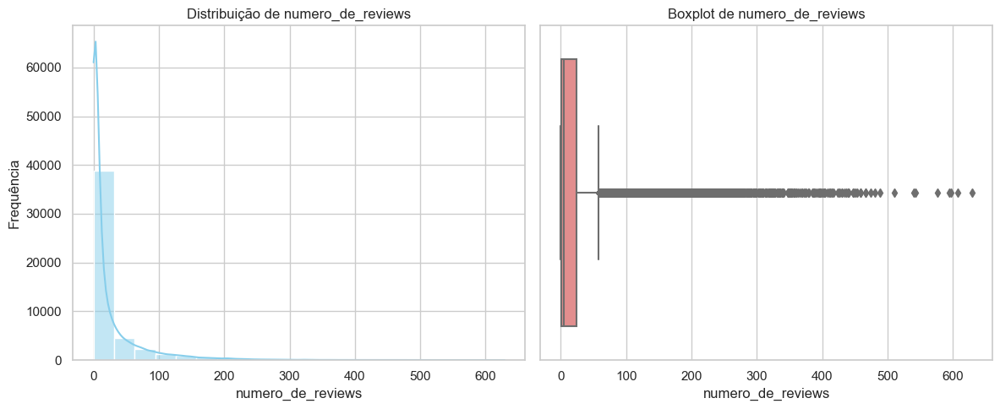

In [19]:
histograma_boxplot(dados=imoveis,coluna='numero_de_reviews')

Ao analisar o histograma percebemos que **a maioria dos imóveis tem entre 0 e 100 avaliações** (frequência mais alta nesses valores).

Por meio do boxplot, a mediana (linha no centro do retângulo) é muito baixa, indicando que metade dos imóveis tem um número de avaliações bem pequeno. O intervalo interquartil (IQR) também é baixo, mostrando que 50% dos dados estão concentrados em um intervalo pequeno.

Há muitos outliers (pontos fora dos limites do boxplot), com alguns imóveis chegando a até 600 avaliações.

Existem alguns imóveis que têm um número muito elevado de avaliações: *Serão possivelmente imóveis populares ou com um longo histórico na plataforma?*

### Distribuição variável 'calculado_host_listings_count'

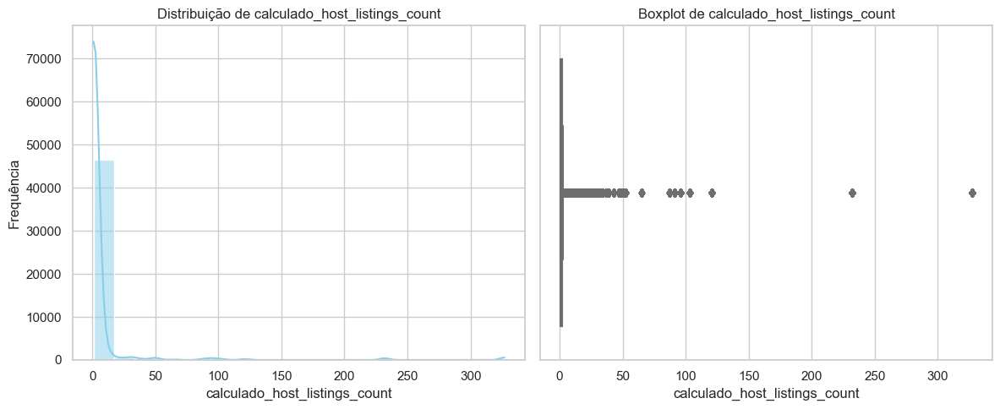

In [20]:
histograma_boxplot(dados=imoveis,coluna='calculado_host_listings_count')

O histograma mostra que a maioria dos donos possui poucos imóveis A.frequência diminui ligeiramente à medida que o número de imóveis aumenta: **É raro um dono possuir um grande número de imóveis**.

**Maior parte dos donos com até 20 imóveis na plataforma.**

Pelo boxplot, a mediana está praticamente colocada em zero em 0, indicando que mais da metade dos donos possui um número muito baixo de imóveis. Existem muitos outliers, com **alguns donos possuindo até 300 imóveis**. 

A maioria dos donos possui poucos imóveis, o que sugere uma alta participação de pequenos proprietários na plataforma.

Existem alguns donos com uma quantidade significativamente maior de imóveis: **Seriam eles possiveis grandes investidores, empresas de gestão de propriedades ?**


### Distribuição variável 'disponibilidade_365'

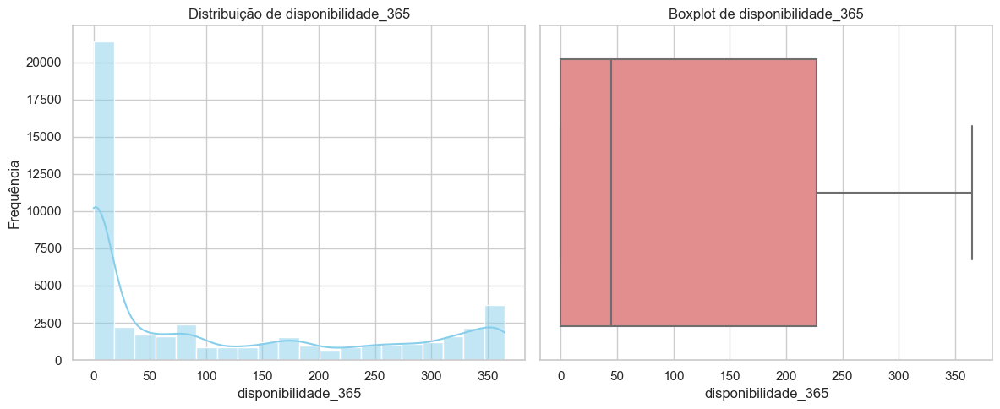

In [21]:
histograma_boxplot(dados=imoveis,coluna='disponibilidade_365')

O histograma mostra que a **maioria dos imóveis tem baixa disponibilidade**, com um pico significativo próximo de 0 dias. Isso sugere que muitos imóveis estão disponíveis apenas por poucos dias ao longo do ano.


Pelo boxplot, o intervalo interquartil se estende até cerca de 200 dias, sugerindo que a maioria dos imóveis está disponível por até 200 dias no ano.

### Comentário geral

A maioria dessas variaveis possuem assimetria o que pode impactar análises estatísticas e sugerir a necessidade de transformações de dados ou métodos robustos para tratar a assimetria.

## Discrepância dos valores de "mínimo_noites"


Ao olharmos para a mediana (50%), terceiro quartil e valor máximo de minímo_noite, percebe-se uma grande amplitude.

Considerando o contexto do negócio, preços bastante elevados são justificados pela cidade NY, predominâmicia de imóveis em uma região premium, além de especificante alguns imóveis serem de "Luxo" comforme suas breves descrições na variável nome. Esses dados refletem a realidade.

No entanto, períodos excessivamente longos de estadia como encontrado ao analisar o resumo estatístico são tão comuns. Não sendo apenas um outlier estatístico, mas que difere do nosso contexto de negócio.

**Portando essas observações precisam de um tratamento.**


### Removendo valores discrepantes

**O intervalo interquartil é uma ferramenta que ajuda a identificar outliers**. Ele destaca os valores incomuns, que estão longe do meio da maioria dos dados.


Na função abaixo, por meio do intervalo interquartil, filtramos os imóveis que podem ser outliers com base na variável especificada.

In [22]:
def remover_outliers(dados, coluna):
    """
    Remove outliers de uma coluna usando o método IQR.
    """
    q1, q3 = dados[coluna].quantile([0.25, 0.75])
    iqr = q3 - q1

    limite_inf = q1 - 1.5 * iqr
    limite_sup = q3 + 1.5 * iqr

    return dados[(dados[coluna] >= limite_inf) & (dados[coluna] <= limite_sup)]

In [23]:
# Total de linhas antes da remoção de outliers
total_antes = len(imoveis)

# Remove outliers da coluna 'minimo_noites'
imoveis = remover_outliers(imoveis, 'minimo_noites')

# Exibe o resultado
linhas_removidas = total_antes - len(imoveis)
print(f'Linhas removidas: {linhas_removidas}')
print(f'Total após remoção: {len(imoveis)}')

Linhas removidas: 6605
Total após remoção: 42277


### Distribuição dos distritos (bairro_group)

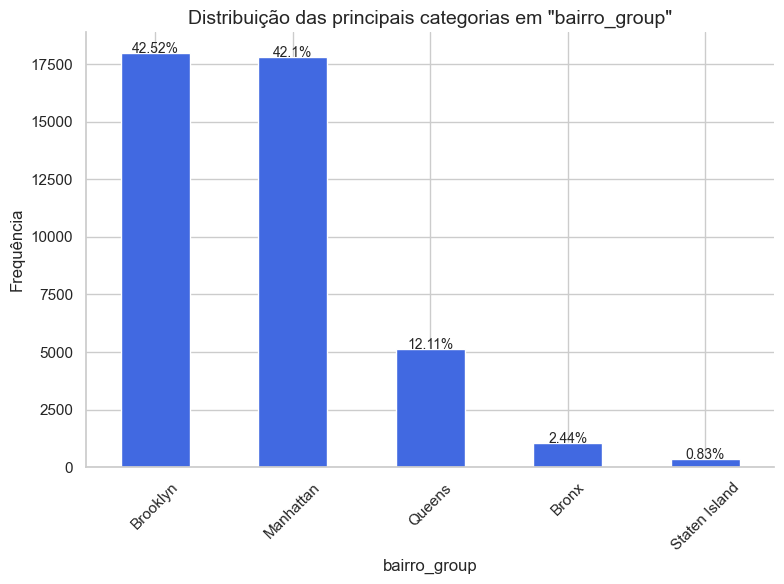

In [24]:
grafico_barras(dados=imoveis,coluna='bairro_group')

As **diferenças econômicas entre os distritos** de Nova York resultam em uma ampla **variação nos preços dos imóveis**. 

Fatores como desenvolvimento urbano, demanda, gentrificação, diversidade cultural e acesso a centros comerciais e financeiros desempenham um papel crucial na determinação dos preços. 

**Brooklyn e Manhattan, sendo altamente desenvolvidos e demandados, têm preços elevados**, enquanto Queens, Bronx e Staten Island oferecem alternativas mais acessíveis, cada um com suas próprias vantagens e desafios econômicos.

### Distribuição dos bairros

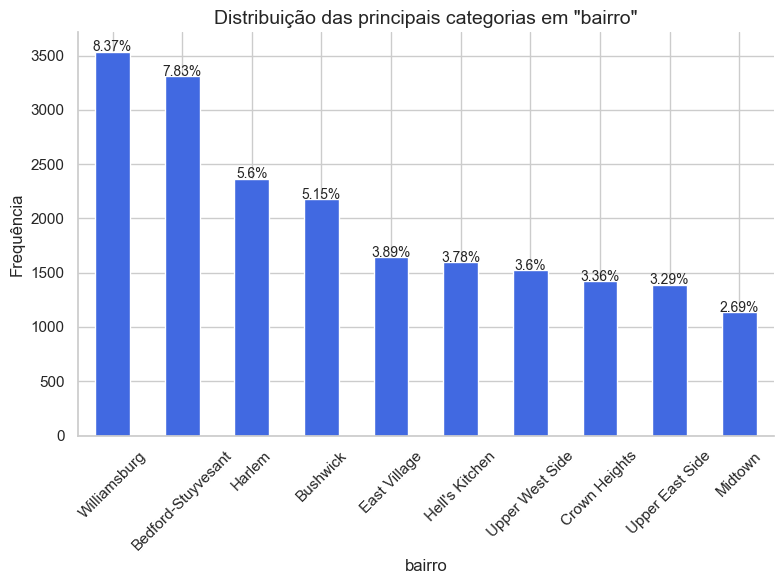

In [25]:
grafico_barras(dados=imoveis,coluna='bairro')

**Williamsburg** é conhecido por sua vibração jovem e artística, atrai muitos jovens profissionais e artistas. A demanda por imóveis é alta, o que eleva os preços. **Proximidade com Manhattan** e vistas deslumbrantes do East River contribuem para a **valorização imobiliária**.

**Bedford-Stuyvesant (Bed-Stuy)**: Ainda enfrenta desafios econômicos, como taxas de pobreza e desemprego mais altas, o que pode manter alguns preços mais baixos.

**Harlem** assim como Bed-Stuy, também **enfrenta gentrificação**, com novos desenvolvimentos **elevando os preços em algumas áreas**.


A proximidade com Manhattan e outras áreas chave de Nova York pode influenciar significativamente os preços.

In [26]:
len(imoveis.bairro.unique())

221

Percebemos uma grande variedade de bairros ao analisar a contagem de bairros únicos. 

Lembrando que nosso objetivo principal é desenvolver um modelo de predição de preços de imóveis, bem como sua avaliação ,aqui é válido uma breve discussão.

### Cardinalidade

A cardinalidade de uma variável categórica se refere ao número de valores distintos que ela pode assumir. Em nosso caso, a variável bairro possui uma alta cardinalidade, com 221 valores diferentes. Isso pode ser um problema/desafio se considerarmos ela uma descritora para treinar nosso modelo. 

É por meio das características de nosso conjunto de dados que um modelo "aprende" padrões úteis para fazer previsões. Se eles forem específicos ou complexos demais, nosso modelo irá "decorar" esses padrões e pode não ser sair bem quando lidar com novos dados que forem ligeiramente diferentes dessas regras.

### Distribuição dos tipos de imóveis

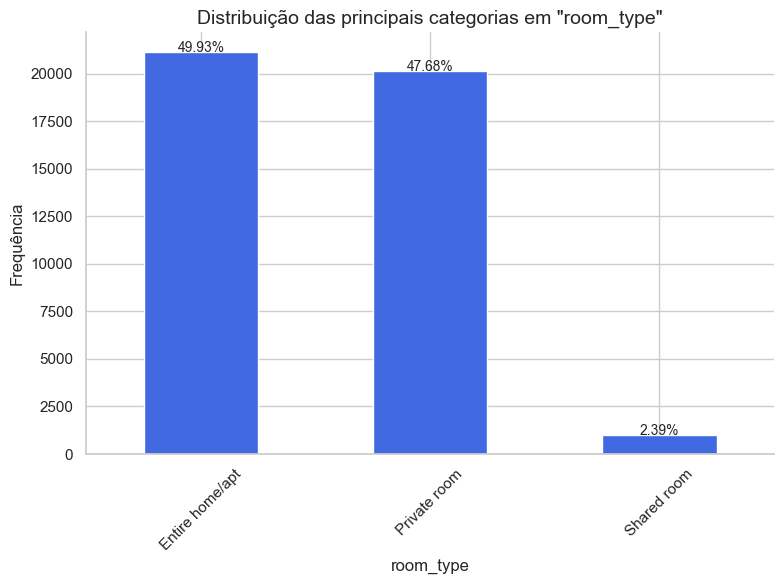

In [27]:
grafico_barras(dados=imoveis,coluna='room_type')

Ao observarmos a distribuição do tipo de anúncio (**room_type**), basicamente oferta de imóveis na plataforma é dividida entre duas grande categorias: Imóvel inteiro ou quarto privado.  Com poucas ofertas de quarto compartilhado

## Um breve passeio em Nova York🗽

Por meio da biblioteca Plotly, projetamos a localização dos imóveis no mapa de Nova York. Para facilitar a visualização, agrupamos os imóveis por bairro e ajustamos o tamanho de cada ponto para que seja proporcional ao valor da diária. Dessa forma, é possível identificar rapidamente as áreas com imóveis de maior valor.

Como já era esperado com base em análises anteriores, os bairros de Brooklyn e Manhattan se destacam no mapa, com pontos de dados significativamente maiores. Isso confirma a tendência de que esses bairros concentram imóveis com diárias mais altas.

In [28]:
# Cria um scatter plot no mapa usando Mapbox
fig = px.scatter_mapbox(
    imoveis, 
    lat="latitude", 
    lon="longitude", 
    hover_data=["price"],  
    color="bairro_group",  
    color_continuous_scale=px.colors.sequential.Cividis_r,
    size="price",          
    zoom=11,                
    height=800,          
    width=1200,            
    mapbox_style="open-street-map",  
)

# Ajusta as margens do gráfico
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})

# Exibe o gráfico
fig.show()

### Featuring Engineering 

Em análise de dados, é comum criarmos novas variáveis, um processo conhecido como **feature engineering**. Isso pode ser feito manualmente, com base em insights do domínio do problema, ou por meio de técnicas automatizadas. 

Ao longo da nossa análise, surgiram algumas ideias que valem a pena explorar, como o custo mínimo de hospedagem e a distância até o centro, que podem responder perguntas-chave sobre o mercado de imóveis. Essas novas variáveis também podem ser aproveitadas na modelagem, enriquecendo o conjunto de dados e melhorando a capacidade preditiva do modelo.

As novas variáveis, descrição e como foram calculadas são apresentadas na seguinte tabela.

| Nome da Variável               | Descrição                                                                 | Fórmula/Cálculo                                                                 |
|--------------------------------|---------------------------------------------------------------------------|---------------------------------------------------------------------------------|
| `custo_minimo_hospedagem`      | Custo mínimo de hospedagem com base no preço e no mínimo de noites.       | `price * minimo_noites`                                                        |
| `rendimento_maximo_anual`      | Rendimento máximo anual estimado com base no preço e disponibilidade.     | `price * disponibilidade_365`                                                  |
| `distancia_ate_centro`         | Distância do imóvel até o centro da cidade em quilômetros.                | Cálculo geográfico usando latitude e longitude (ex: fórmula de Haversine).     |
| `meses_estimados_plataforma`   | Meses estimados que o imóvel está na plataforma.                          | `numero_de_reviews / reviews_por_mes`                                          |
| `disponibilidade`              | Representação categórica da disponibilidade dos imóveis.                  | `Baixa` (valores < 45), `Média` (45 ≤ valores < 227), `Alta` (valores ≥ 227)   |


In [29]:
# Distância até o centro da cidade (Nova York como referência)
def distancia_ate_centro(lat, lon, centro_lat=40.7128, centro_lon=-74.0060):
    return geodesic((lat, lon), (centro_lat, centro_lon)).km

# Estima meses ativos na plataforma
def calcular_meses(linha):
    return linha['numero_de_reviews'] / linha['reviews_por_mes'] if linha['reviews_por_mes'] > 0 else 0

# Classifica disponibilidade com base nos dias
def classificar_disponibilidade(dias):
    if dias >= 227:
        return 'Alta'
    if dias >= 45:
        return 'Média'
    return 'Baixa'

In [30]:
# Calcula custo mínimo da hospedagem
imoveis['custo_minimo_hospedagem'] = imoveis['price'] * imoveis['minimo_noites']

# Estima rendimento máximo anual
imoveis['rendimento_maximo_anual'] = imoveis['price'] * imoveis['disponibilidade_365']

# Aplica cálculo de distância ao DataFrame
imoveis['distancia_ate_centro'] = imoveis.apply(
    lambda linha: distancia_ate_centro(linha['latitude'], linha['longitude']), axis=1)

# Estima meses ativos na plataforma
imoveis['meses_estimados_plataforma'] = imoveis.apply(calcular_meses, axis=1).round(1)

imoveis['disponibilidade'] = imoveis['disponibilidade_365'].apply(classificar_disponibilidade)

### Resumo Estatístico (novas variáveis)

In [31]:
novas_variaveis = ['custo_minimo_hospedagem','rendimento_maximo_anual','distancia_ate_centro','meses_estimados_plataforma']

In [32]:
imoveis[novas_variaveis].describe().round(2)

,custo_minimo_hospedagem,rendimento_maximo_anual,distancia_ate_centro,meses_estimados_plataforma
count,42277.00,42277.00,42277.00,42277.00
mean,409.36,17101.33,7.59,22.39
std,690.01,50412.05,4.60,22.58
min,10.00,0.00,0.04,0.00
25%,120.00,0.00,4.43,2.40
50%,250.00,2820.00,6.60,15.90
75%,495.00,19110.00,9.92,36.40
max,50000.00,2920000.00,30.90,128.60


### P1: Em qual região vale mais a pena comprar um imóvel para investir em aluguel?


Para responder a essa pergunta de negócio, olhar apenas para as variáveis price e bairro pode levar a uma conclusão enganosa. O que realmente precisamos saber é o valor máximo que um proprietário pode obter de receita com seu imóvel. Para isso, combinamos a variável disponibilidade_365 com o price, calculando o rendimento máximo anual.

Como os valores de preço variam bastante (o que é natural nesse contexto), usar a média poderia distorcer a análise. Por isso, optamos por analisar a mediana do rendimento máximo anual, agrupada por bairro_group.

Com essa abordagem, descobrimos que o bairro Staten Island é o que oferece o maior rendimento mediano, com um valor de $12.707 por ano.

In [33]:
# Estatísticas do rendimento máximo anual por bairro
estatisticas_rendimento = imoveis.groupby('bairro_group')['rendimento_maximo_anual'].describe().round(2)

print("Estatísticas do rendimento máximo anual por bairro:")
print(estatisticas_rendimento)

# Bairro com maior mediana de rendimento anual
bairro_top = imoveis.groupby('bairro_group')['rendimento_maximo_anual'].median().idxmax()
mediana_top = imoveis.groupby('bairro_group')['rendimento_maximo_anual'].median().max()

print(f"\nBairro com maior rendimento mediano anual: {bairro_top}")
print(f"Mediana do rendimento anual: ${mediana_top:.2f}")

Estatísticas do rendimento máximo anual por bairro:
                 count      mean       std  min     25%      50%       75%  \
bairro_group                                                                 
Bronx           1030.0  15630.35  26569.54  0.0  1891.5   8810.0  19288.75   
Brooklyn       17978.0  13283.95  41458.02  0.0     0.0   1846.5  16065.00   
Manhattan      17797.0  21354.71  61380.79  0.0     0.0   1650.0  23465.00   
Queens          5121.0  15484.08  31020.75  0.0   102.0   7650.0  19980.00   
Staten Island    351.0  24874.87  95895.19  0.0  4422.5  12707.0  24735.50   

                     max  
bairro_group              
Bronx           447500.0  
Brooklyn       2920000.0  
Manhattan      2730000.0  
Queens          941200.0  
Staten Island  1720000.0  

Bairro com maior rendimento mediano anual: Staten Island
Mediana do rendimento anual: $12707.00


### P2: O número mínimo de noites e a disponibilidade ao longo do ano interferem no preço?

Para responder a essa pergunta, utilizamos um gráfico de dispersão (scatterplot) combinado com uma linha de tendência. Esses gráficos nos permitem visualizar como os pontos de dados estão distribuídos entre cada variável (minimo_noites e disponibilidade_365) e o preço.


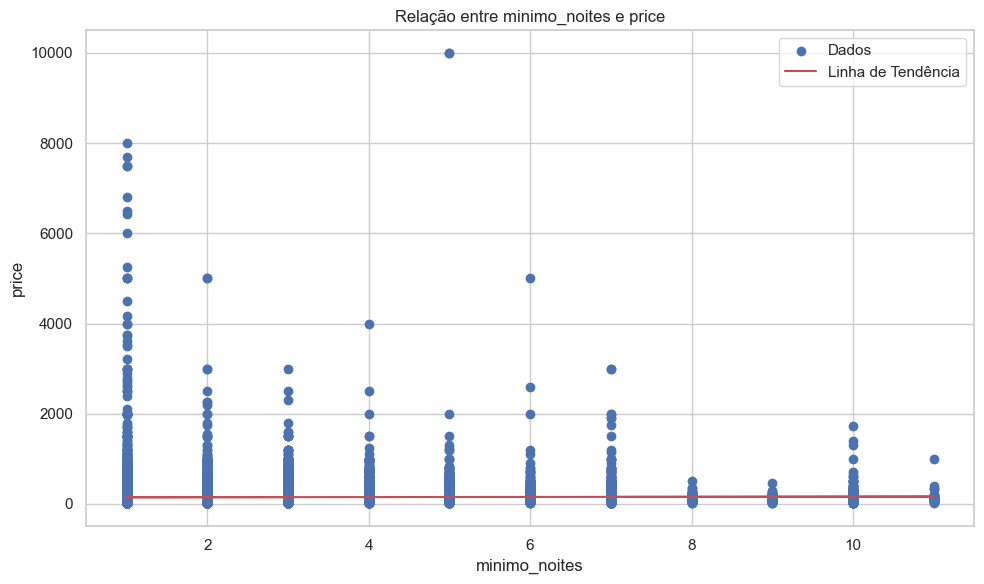

In [34]:
scatterplot(dados=imoveis, x='minimo_noites', y='price')

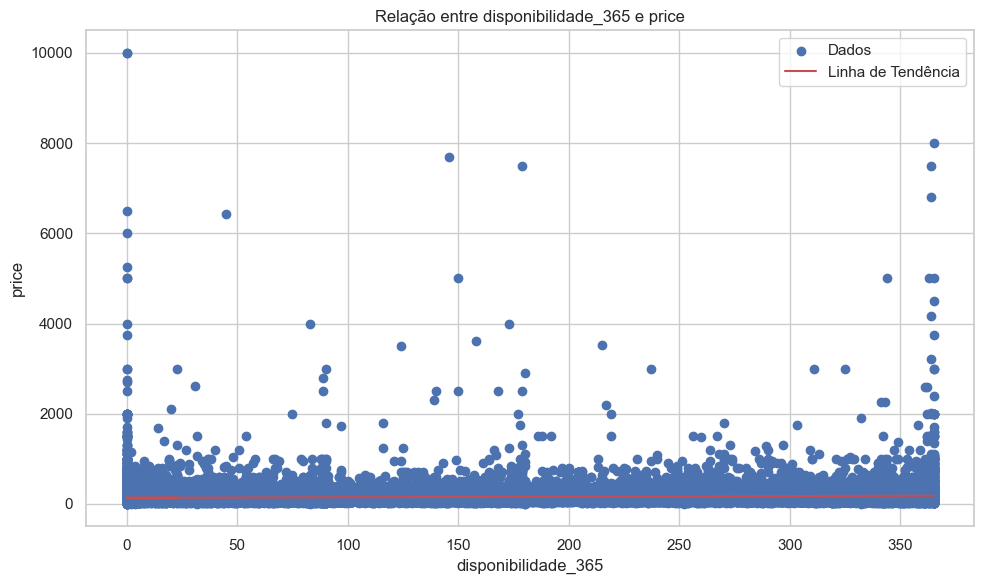

In [35]:
scatterplot(dados=imoveis, x='disponibilidade_365', y='price')

Em ambos os gráficos, observamos que a linha de tendência se mantém quase constante, o que indica que as variáveis número mínimo de noites e disponibilidade ao longo do ano têm pouca influência no preço.

É importante ressaltar que isso não significa que essas variáveis devam ser descartadas no modelo. No entanto, com base nos gráficos, podemos inferir que ambas contribuem de forma limitada para a variação do preço.

### H1: A popularidade (reviews) impacta no preço?

Para responder a essa pergunta, partimos da hipótese de que imóveis mais populares (com mais avaliações) teriam preços de diária mais altos. No entanto, ao analisar o gráfico de dispersão e a linha de tendência, observamos um comportamento diferente: imóveis mais baratos tendem a ter mais avaliações.

Isso sugere que imóveis com preços mais acessíveis são alugados com maior frequência, acumulando um número maior de avaliações ao longo do tempo.

Portanto, a **popularidade parece estar mais relacionada à acessibilidade do que ao valor da diária**.

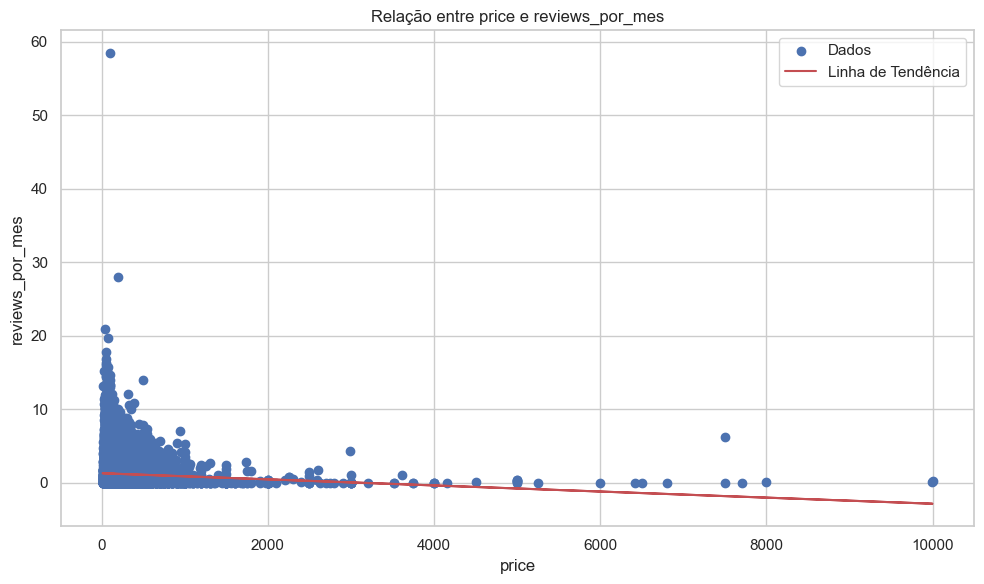

In [36]:
scatterplot(dados=imoveis, x='price',y='reviews_por_mes')

### H2: Quais bairros possuem mais locação?

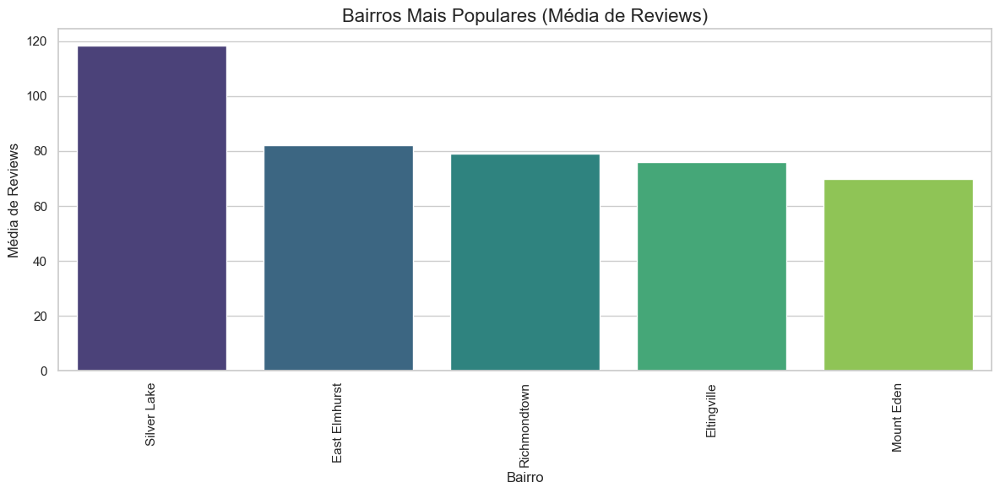

In [37]:
# Top 5 bairros com maior média de reviews
popularidade_bairros = (
    imoveis.groupby('bairro')['numero_de_reviews']
    .mean()
    .sort_values(ascending=False)
    .head(5)
)

plt.figure(figsize=(12, 6))
sns.barplot(x=popularidade_bairros.index, y=popularidade_bairros.values, palette='viridis')

# Ajustes no gráfico
plt.title('Bairros Mais Populares (Média de Reviews)', fontsize=16)
plt.xlabel('Bairro', fontsize=12)
plt.ylabel('Média de Reviews', fontsize=12)
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

Pesquisando no Google, encontramos algumas informações que possam complementar essas preferências:

Os bairros Silver Lake, East Elmhurst, Richmondtown, Eltingville e Mount Eden se destacam em Nova York por suas características únicas. **Silver Lake é tranquilo e paisagístico**, atraindo quem busca um refúgio urbano. East Elmhurst, **perto do Aeroporto LaGuardia**, é conveniente para viajantes. Richmondtown e Eltingville em Staten Island oferecem uma atmosfera suburbana segura. Mount Eden, no **Bronx**, é **vibrante e culturalmente diversificado**, atraindo muitos moradores e visitantes.

### H3: Qual o períódo Nova York recebeu mais hóspedes no contexto da nossa base de dados?

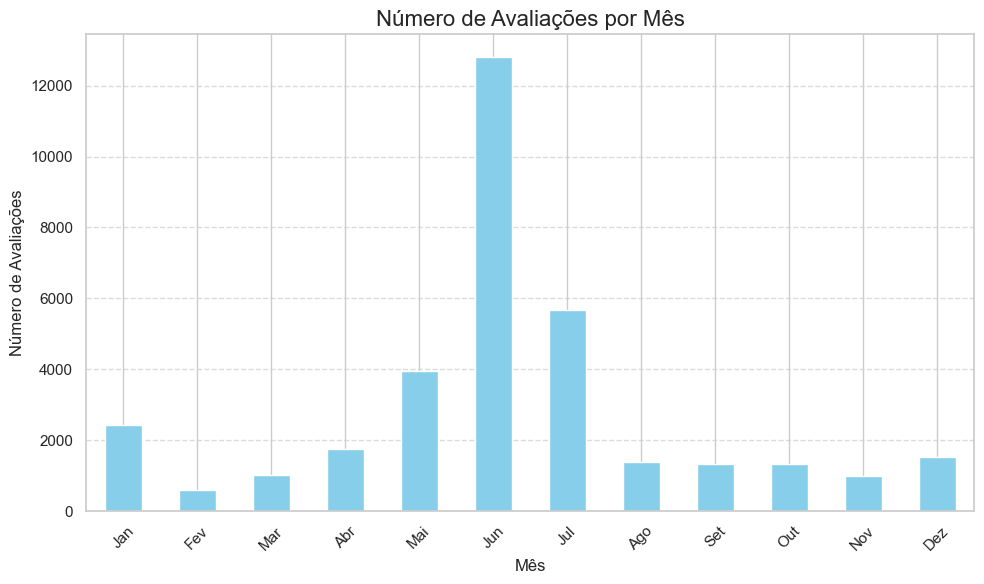

In [38]:
# Converte 'ultima_review' para datetime e extrai o mês
imoveis['ultima_review'] = pd.to_datetime(imoveis['ultima_review'], errors='coerce')
imoveis['mes'] = imoveis['ultima_review'].dt.month

# Conta as avaliações por mês
avaliacoes_por_mes = imoveis['mes'].value_counts().sort_index()

# Plota o gráfico de barras
plt.figure(figsize=(10, 6))
avaliacoes_por_mes.plot(kind='bar', color='skyblue')

# Ajustes finais no gráfico
plt.title('Número de Avaliações por Mês', fontsize=16)
plt.xlabel('Mês', fontsize=12)
plt.ylabel('Número de Avaliações', fontsize=12)
plt.xticks(range(12), ['Jan', 'Fev', 'Mar', 'Abr', 'Mai', 'Jun', 'Jul', 'Ago', 'Set', 'Out', 'Nov', 'Dez'], rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibe o gráfico
plt.tight_layout()
plt.show()

Junho se destacou como o período com o maior número de avaliações, e consequentemente, foi quando Nova York recebeu mais hóspedes, de acordo com nosso conjunto de dados. Ao investigar esse comportamento, e considerando que a maioria das avaliações é de 2019, descobrimos que a cidade sediou grandes eventos nesse mês, incluindo o Orgulho LGBT.

Identificar os períodos de maior demanda por aluguéis é uma informação valiosa para que os anfitriões possam se planejar melhor e maximizar suas receitas.

### Outras correlações 

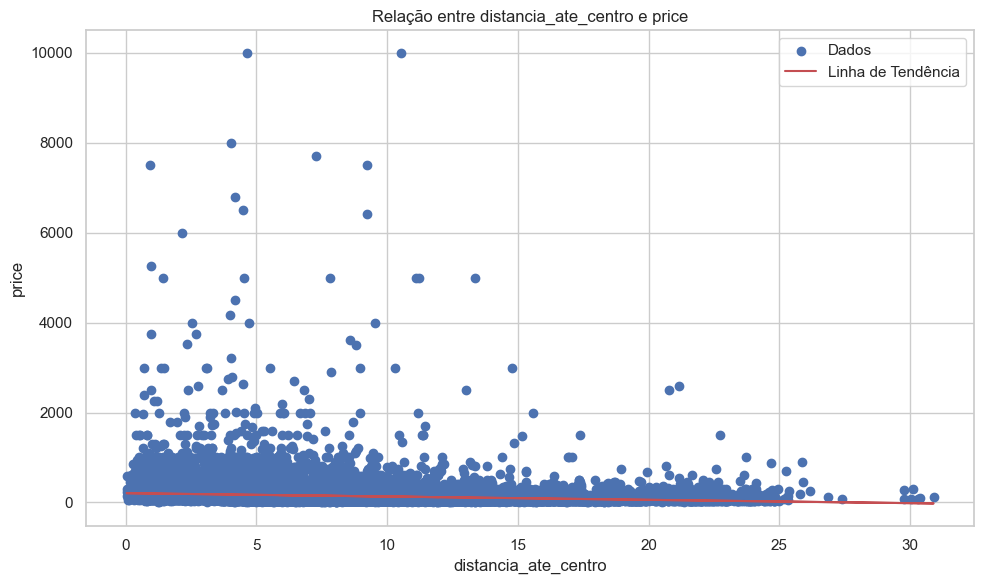

In [39]:
scatterplot(dados=imoveis, x='distancia_ate_centro', y='price')

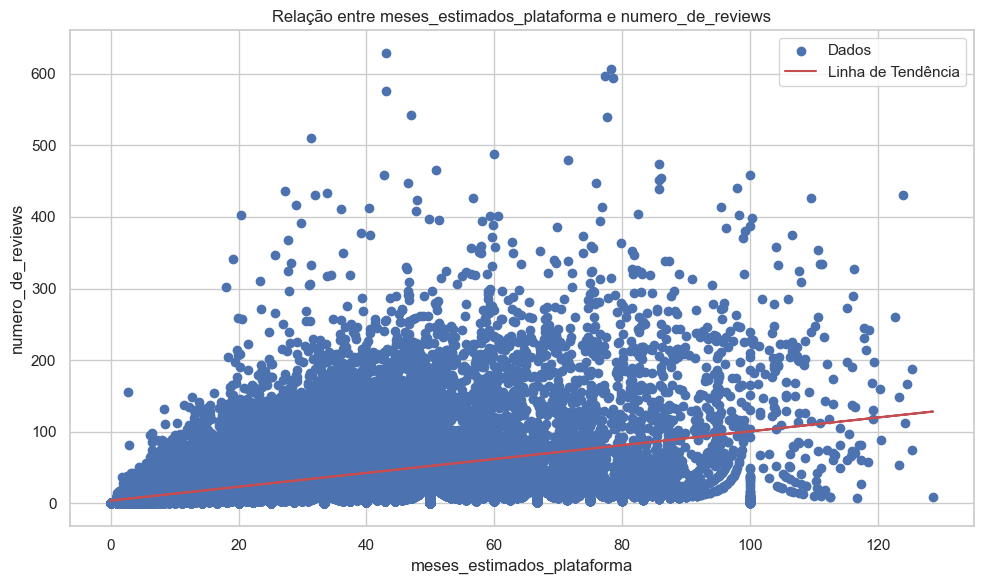

In [40]:
scatterplot(dados=imoveis, x='meses_estimados_plataforma', y='numero_de_reviews')

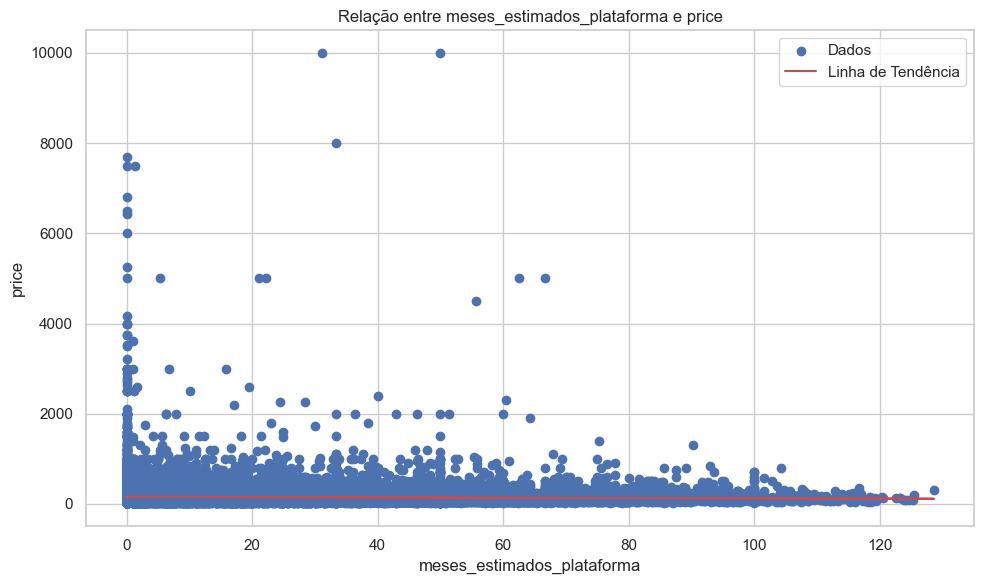

In [41]:
scatterplot(dados=imoveis, x='meses_estimados_plataforma', y='price')

Correlação das variáveis com o preço (price):
price                            1.000000
custo_minimo_hospedagem          0.723115
rendimento_maximo_anual          0.671261
disponibilidade_365              0.078106
calculado_host_listings_count    0.045314
latitude                         0.031600
host_id                          0.013877
mes                              0.013472
minimo_noites                    0.012575
meses_estimados_plataforma      -0.036239
numero_de_reviews               -0.051951
reviews_por_mes                 -0.052374
longitude                       -0.158465
distancia_ate_centro            -0.161642
Name: price, dtype: float64


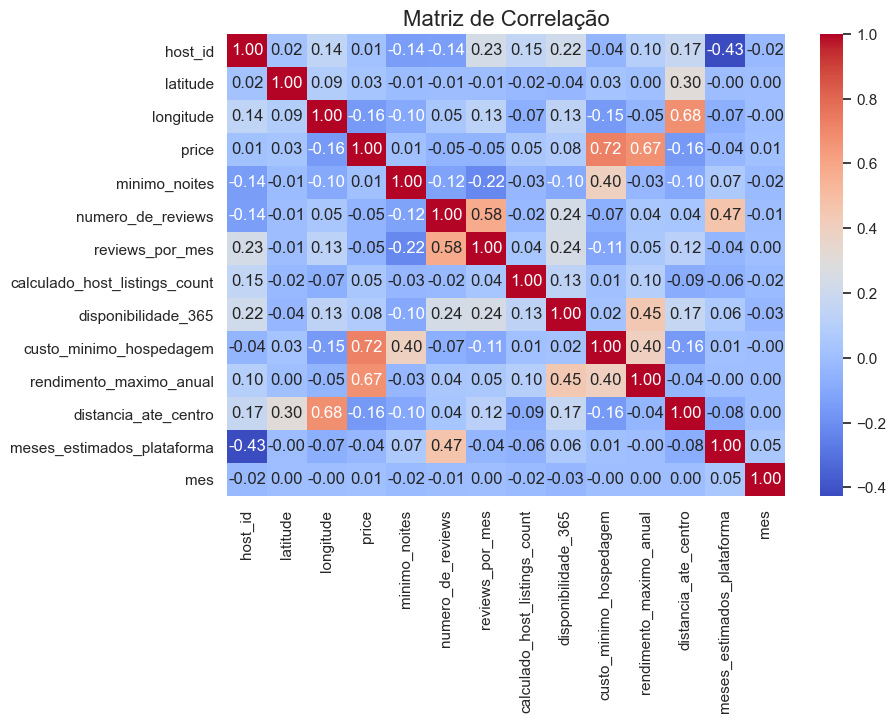

In [42]:
# Calcula a matriz de correlação entre variáveis numéricas
correlation_matrix = imoveis.select_dtypes(include='number').corr()

# Ordena a correlação com o preço (price)
correlacao_com_price = correlation_matrix['price'].sort_values(ascending=False)

# Exibe as correlações com o preço
print("Correlação das variáveis com o preço (price):")
print(correlacao_com_price)

# Plota a matriz de correlação
plt.figure(figsize=(9, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Matriz de Correlação', fontsize=16)
plt.show()

## Um pequeno trabalho de Mineração de Textos 

### P3: Existe algum padrão no texto do nome do local para lugares de mais alto valor?


#### O que o títulos dos anúncios nos contam ?

Para responder à terceira pergunta de negócio, sobre os padrões nos termos dos títulos dos anúncios de imóveis com preços mais elevados, utilizamos técnicas de **Processamento de Linguagem Natural (NLP)**, um ramo da Inteligência Artificial (IA) focado em entender a linguagem humana. 

Dentro da NLP, empregamos a **mineração de textos** para analisar e extrair padrões. Limpamos os dados textuais para remover ruídos e garantir que os termos mais relevantes fossem destacados. Em seguida, geramos uma nuvem de palavras (word cloud) para visualizar as palavras mais frequentes, facilitando a identificação de padrões nos anúncios.

In [43]:
# Função de pré-processamento de texto
def preprocess_text(text):
    text = text.lower()  # Converte para minúsculas
    text = re.sub(r'\d+', '', text)  # Remove números
    text = re.sub(r'[^\w\s]', '', text)  # Remove pontuações
    text = ' '.join([word for word in text.split() if word not in stopwords.words('english')])  # Remove stopwords
    return text

In [44]:
# Função para gerar e exibir a nuvem de palavras
def wordcloud(dataframe, fieldname, mask_filename):
    # Junta todos os textos da coluna especificada
    text = " ".join(dataframe[fieldname])

    # Carrega a máscara e as cores da imagem
    mask = np.array(Image.open(mask_filename))
    image_colors = ImageColorGenerator(mask)

    # Cria a nuvem de palavras
    wordcloud = WordCloud(
        collocations=False, width=8000, height=8000, mask=mask, background_color='white',
        max_words=50, contour_color='grey', contour_width=1, font_path='../fonts/Ignazio.ttf',
        max_font_size=72, random_state=42, min_font_size=10
    ).generate(text)

    # Plota a nuvem de palavras
    plt.figure(figsize=(6, 6), dpi=600)
    plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation="bilinear")
    plt.axis("off")
    plt.show()

In [45]:
# Preenche valores ausentes em 'nome' com string vazia
imoveis['nome'] = imoveis['nome'].fillna('')

In [46]:
# Aplica o pré-processamento
imoveis['nomes_prepreprocessing'] = imoveis['nome'].apply(preprocess_text)

In [47]:
# Exibe as primeiras linhas antes e depois do pré-processamento
print(imoveis[['nome', 'nomes_prepreprocessing']].head())

                                               nome  \
1               THE VILLAGE OF HARLEM....NEW YORK !   
2                   Cozy Entire Floor of Brownstone   
3  Entire Apt: Spacious Studio/Loft by central park   
4         Large Cozy 1 BR Apartment In Midtown East   
6                  Large Furnished Room Near B'way    

                        nomes_prepreprocessing  
1                       village harlemnew york  
2                 cozy entire floor brownstone  
3  entire apt spacious studioloft central park  
4         large cozy br apartment midtown east  
6               large furnished room near bway  


In [48]:
# Filtra imóveis abaixo 175 no preço
imoveis_abaixo_price175 = imoveis[imoveis['price'] < 175]
print(len(imoveis_abaixo_price175))

31362


In [49]:
# Filtra acima de 175 no preço
imoveis_acima_price175 = imoveis[imoveis['price'] > 175]
print(len(imoveis_acima_price175))

10255


### Nuvem de palavras (Imóveis preços menos elevados)

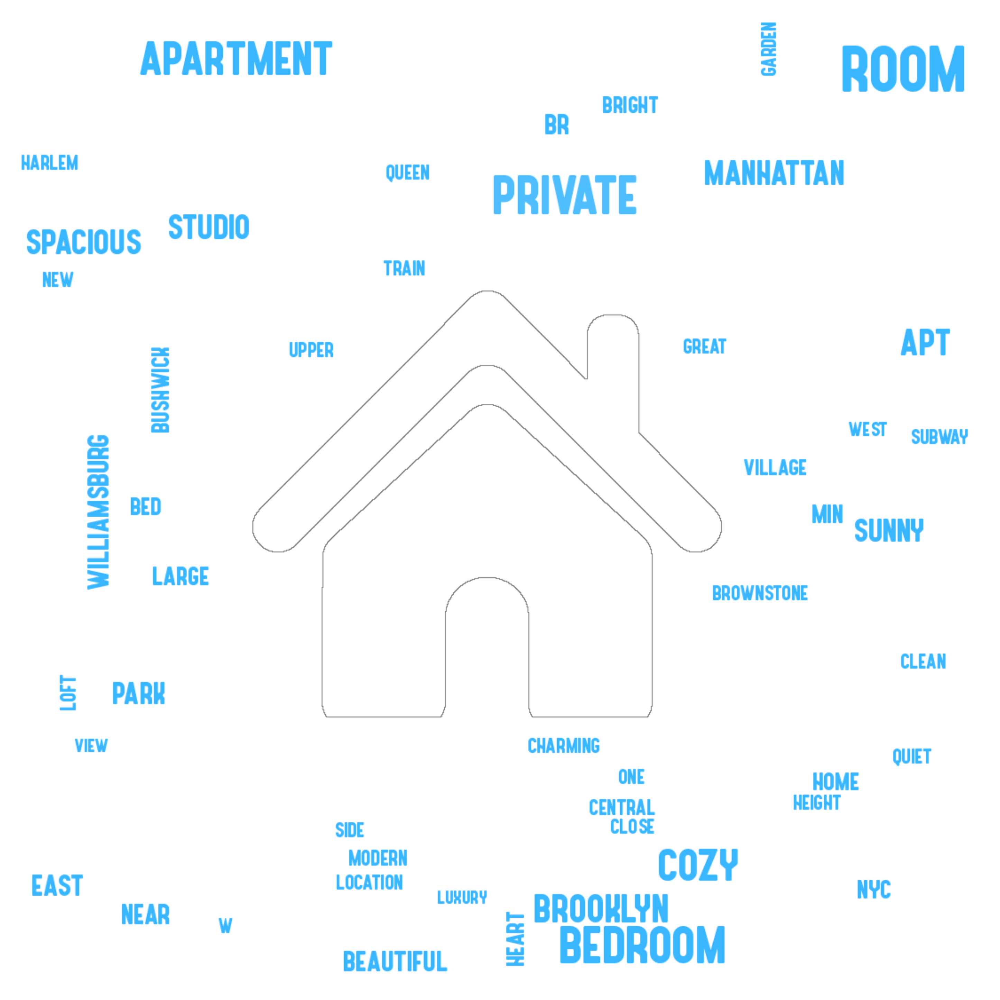

In [50]:
wordcloud(imoveis_abaixo_price175,'nomes_prepreprocessing', '../images/home_blue.png')

### Nuvem de palavras (Imóveis preços mais elevados)

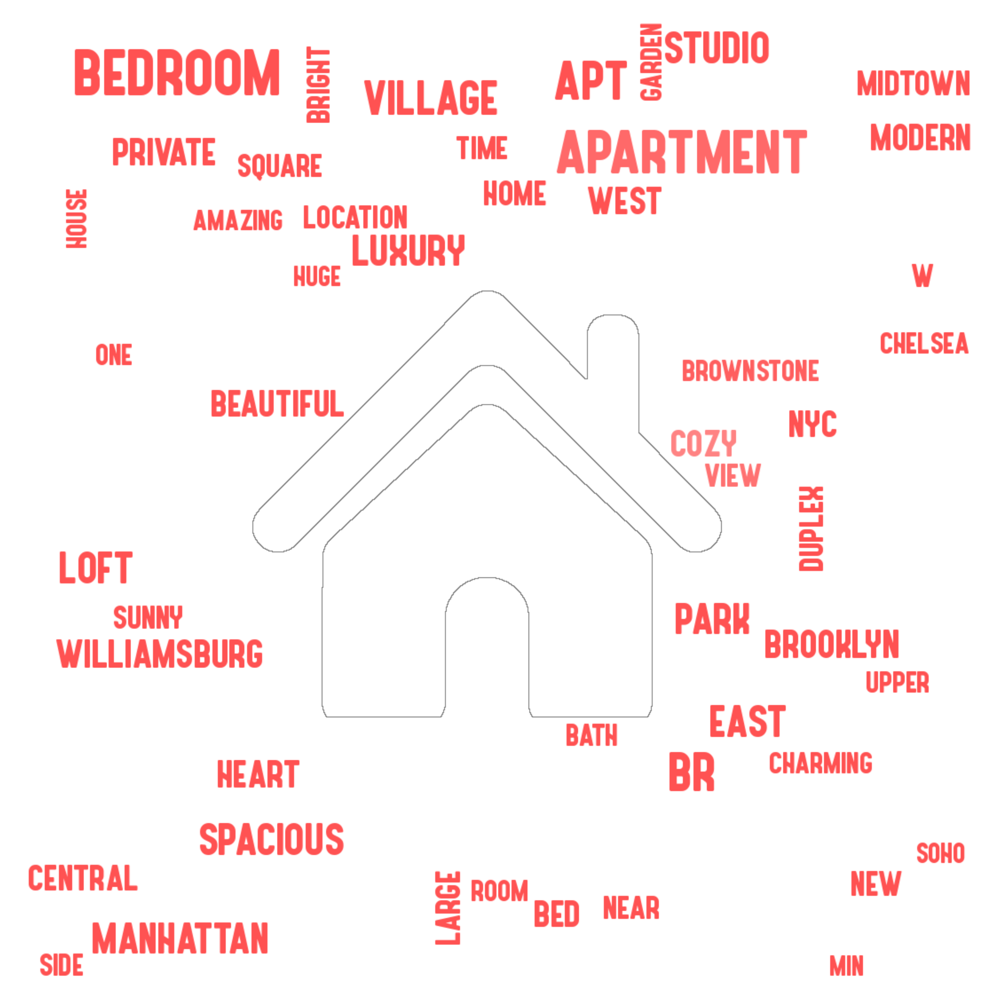

In [51]:
wordcloud(imoveis_acima_price175,'nomes_prepreprocessing','../images/home_red.png')

Por meio da visualização da nuvem de palavras, conseguimos identificar os principais termos encontrados nos grupos de imóveis com preços mais baixos e mais elevados. Observando os quartis, arbitrariamente o valor de 175 foi escolhido para dividir esses dois grupos, pois 75% dos imóveis têm preços abaixo desse valor, enquanto os outros 25% estão acima e se estendem até 10.000. 

As duas nuvens de palavras possuem alguns termos em comum, mas é importante observar o tamanho desses termos. Quanto maior o termo, mais presente ele é em cada grupo. A segunda figura sugere que **imóveis com diárias mais elevadas costumam destacar características que justificam seus preços, como "luxury", "spacious", "modern" e "studio", além de termos relacionados a localizações específicas.**

## 03.Preparação dos dados (Data Preparation)

Ao longo do relatório, passamos pela análise do resumo estatístico e pela Análise Exploratória de Dados (EDA), onde corrigimos diversas características, como linhas com imóveis sem preço, variáveis ausentes, remoção de outliers e criação de novas variáveis conforme o contexto de negócio. Estas são tarefas comuns nesta etapa da preparação dos dados.

Nesta seção, selecionaremos as variáveis mais relevantes, codificaremos e transformaremos as variáveis categóricas e numéricas. Essas etapas são fundamentais, pois a forma como os dados são apresentados influencia diretamente no desempenho dos modelos de predição.

### Seleção de Variáveis relevantes

Com base nas seções anteriores, identificamos que as variáveis mais relevantes para criar um modelo de predição de preços de imóveis são:

| Variável                | Tipo       | Justificativa                                                                                     |
|-------------------------|------------|---------------------------------------------------------------------------------------------------|
| `bairro_group`          | Categórica | Divide os imóveis em grupos com características comuns, facilitando a separação dos dados pelo modelo. |
| `room_type`             | Categórica | Indica se o imóvel é inteiro ou apenas um quarto privado, influenciando significativamente o preço. |
| `disponibilidade`       | Categórica | Reflete a baixa, média ou alta disponibilidade do imóvel. Imóveis com baixa disponibilidade geralmente têm preços mais altos. |
| `reviews_por_mes`       | Numérica   | Imóveis com diárias mais baratas tendem a ter mais avaliações, contribuindo para a predição do preço. |
| `distancia_ate_centro`  | Numérica   | Imóveis mais próximos do centro são geralmente mais caros, tornando essa variável relevante.       |
| `price`                 | Numérica   | Variável alvo que representa o preço do imóvel.                                                   |


In [52]:
variaveis_selecionadas = ['bairro_group','room_type','disponibilidade','reviews_por_mes','distancia_ate_centro','price']

### Codificação e Transformações

Para utilizar essas variáveis nos modelos de predição, é necessário:

**Codificar variáveis categórica**s: Usamos o método get_dummies para transformar categorias em valores numéricos, tornando os dados compatíveis com algoritmos de aprendizado de máquina.

**Transformar variáveis numéricas**: Variáveis como 'room_type' e 'distancia_ate_centro' operam em escalas diferentes. Utilizamos o método RobustScaler para normalizar os dados, garantindo que todas as variáveis tenham a mesma influência no modelo.

**Transformação logarítmica no preço**: A aplicação de uma transformação logarítmica ao preço ajuda a estabilizar a variância e a reduzir a influência de outliers, melhorando a performance do modelo.

In [53]:
# Aplicando One-Hot Encoding nas variáveis categóricas selecionadas
imoveis_codificados = pd.get_dummies(imoveis[variaveis_selecionadas],columns=['bairro_group',
                                          'room_type', 'disponibilidade'], drop_first=False)

In [54]:
# Definindo as colunas numéricas para normalização
colunas_numericas = ['reviews_por_mes', 'distancia_ate_centro']

# Aplicando o RobustScaler às colunas numéricas
scaler = RobustScaler()
imoveis_codificados[colunas_numericas] = scaler.fit_transform(imoveis_codificados[colunas_numericas])

In [55]:
# Transformando o preço em uma escala logarítmica
imoveis_codificados['price'] = np.log(imoveis_codificados['price'])

In [56]:
imoveis_codificados.head(3)

,reviews_por_mes,distancia_ate_centro,price,bairro_group_Bronx,bairro_group_Brooklyn,bairro_group_Manhattan,bairro_group_Queens,bairro_group_Staten Island,room_type_Entire home/apt,room_type_Private room,room_type_Shared room,disponibilidade_Alta,disponibilidade_Baixa,disponibilidade_Média
1,-0.272222,0.979668,5.010635,0,0,1,0,0,0,1,0,1,0,0
2,2.305556,-0.297608,4.488636,0,1,0,0,0,1,0,0,0,0,1
3,-0.216667,0.776528,4.382027,0,0,1,0,0,1,0,0,0,1,0


## 04. Modelagem (Modeling) - Qual tipo de problema estamos resolvendo ?


Dentro do aprendizado de máquina (machine learning), existem três tipos principais de aprendizado: i) supervisionado, ii) não supervisionado e iii) por reforço.

No aprendizado supervisionado, o modelo aprende com dados rotulados, onde temos uma entrada (X) e uma saída esperada (Y). O objetivo é encontrar um padrão que relacione os dados de entrada às respostas corretas. Dentro deste tipo, temos dois principais problemas: a) classificação e b) regressão.

Classificação ocorre quando a saída é uma categoria, como "spam" ou "não spam".

**Regressão ocorre quando a saída é um valor contínuo, como o preço de um imóvel (nosso caso).**


Para criar nosso modelo de predição de preços de imóveis, optamos por utilizar **algoritimos de regressão simples** disponíveis na biblioteca do **scikit-learn**, com suas configurações padrão. 

Os algoritmos de regressão implementados foram: *i)Regressão Linear, ii)Árvore de Decisão, iii)Random Forest e iv)Regressão Ridge*. 

**A documentação do scikit-learn foi fundamental em praticamente todas as etapas, fornecendo sugestões de implementações.**

Dividimos nosso conjunto de dados em duas partes: 70% para treino e 30% para teste, proporções comuns em problemas de modelagem. 

In [57]:
# Função para dividir os dados em treino e teste
def dividir_dados(df, alvo, proporcao_teste=0.3, semente=42):
    X = df.drop(columns=[alvo])  # Seleciona as variáveis independentes
    y = df[alvo]  # Seleciona a variável alvo
    X_treino, X_teste, y_treino, y_teste = train_test_split(X, y, test_size=proporcao_teste, random_state=semente)
    return X_treino, X_teste, y_treino, y_teste

Utilizamos o **Mean Squared Error (MSE)** como principal medida de avaliação de desempenho, complementado pelo Mean Absolute Percentage Error (MAPE) e pelo Coeficiente de Determinação (R²). 

O MSE foi escolhido como principal métrica pois **penaliza fortemente os erros grandes**, o que é crucial em contextos de investimento onde previsões de preços imprecisas podem ser prejudiciais ao negócio.

A **validação cruzada** é uma técnica eficaz para avaliar a performance do modelo, dividindo os dados em múltiplos subconjuntos e treinando o modelo diversas vezes em diferentes combinações desses subconjuntos.

Adotamos **validação cruzada** com 5 folds para **garantir que o modelo generalize bem** para novos dados.

In [58]:
# Função para realizar a validação cruzada e calcular métricas
def validacao_cruzada(modelo, X_treino, y_treino, cv=5):
    mape_scores = cross_val_score(modelo, X_treino, y_treino, cv=cv, scoring='neg_mean_absolute_percentage_error')
    r2_scores = cross_val_score(modelo, X_treino, y_treino, cv=cv, scoring='r2')
    mse_scores = cross_val_score(modelo, X_treino, y_treino, cv=cv, scoring='neg_mean_squared_error')
    
    # Calculando as médias e os desvios padrão das métricas
    mean_mape = -mape_scores.mean()  # Convertendo para valor positivo
    std_mape = mape_scores.std()
    mean_r2 = r2_scores.mean()
    std_r2 = r2_scores.std()
    mean_mse = -mse_scores.mean()  # Convertendo para valor positivo
    std_mse = mse_scores.std()
    
    return mean_mape, std_mape, mean_r2, std_r2, mean_mse, std_mse

In [59]:
# Função para testar diferentes modelos e comparar resultados
def testar_modelos(X_treino, y_treino):
    modelos = {
        "Regressão Linear": LinearRegression(),
        "Árvore de Decisão": DecisionTreeRegressor(),
        "Random Forest": RandomForestRegressor(),
        "Regressão Ridge": Ridge()
    }

    resultados = {}
    # Para cada modelo, realiza a validação cruzada e armazena os resultados
    for nome, modelo in modelos.items():
        media_mape, desvio_mape, media_r2, desvio_r2, media_mse, desvio_mse = validacao_cruzada(modelo, X_treino, y_treino)
        resultados[nome] = {
            "Média do MAPE (%)": media_mape * 100,  # Convertendo para percentual
            "Desvio Padrão do MAPE (%)": desvio_mape * 100,
            "Média do R² (%)": media_r2 * 100,  # Convertendo para percentual
            "Desvio Padrão do R² (%)": desvio_r2 * 100,
            "Média do MSE": media_mse,
            "Desvio Padrão do MSE": desvio_mse
        }

    return pd.DataFrame(resultados).T

In [60]:
# Função para avaliar o desempenho de um modelo no conjunto de teste
def avaliar_modelo(modelo, X_teste, y_teste):
    y_pred = modelo.predict(X_teste)

    mse = mean_squared_error(y_teste, y_pred)
    r2 = r2_score(y_teste, y_pred)
    mape = mean_absolute_percentage_error(y_teste, y_pred)

    return {"MSE": mse, "R²": r2, "MAPE": mape}

### Divisão dos dados (Treino e Teste)

In [61]:
X_treino, X_teste, y_treino, y_teste = dividir_dados(imoveis_codificados, 'price')

In [62]:
print(f"Conjunto de Treinamento: {X_treino.shape[0]} instâncias")
print(f"Conjunto de Teste: {X_teste.shape[0]} instâncias")

Conjunto de Treinamento: 29593 instâncias
Conjunto de Teste: 12684 instâncias


### Treino dos Modelos

In [63]:
resultados = testar_modelos(X_treino, y_treino)

In [64]:
resultados

,Média do MAPE (%),Desvio Padrão do MAPE (%),Média do R² (%),Desvio Padrão do R² (%),Média do MSE,Desvio Padrão do MSE
Regressão Linear,7.360520,0.100013,51.211502,0.595412,0.228888,0.007114
Árvore de Decisão,9.911769,0.117507,10.689974,1.679683,0.418411,0.008786
Random Forest,7.651165,0.085105,46.845101,0.686251,0.249677,0.005990
Regressão Ridge,7.360551,0.100011,51.211530,0.595529,0.228888,0.007116


#### Comentários

Avaliamos os modelos usando a métrica principal **MSE**, e complementamos essa análise com as métricas **R²** e **MAPE**. Os achados foram bastante interessantes:

A **Regressão Linear** e a **Regressão Ridge** tiveram **resultados semelhantes**, ambos apresentando uma média de MSE em torno de 0.22 e um R² de cerca de **51.2%**. Isso significa que esses modelos conseguem captar bem a variação nos preços dos imóveis e são **eficazes em prever valores próximos da realidade**.

A métrica MSE é particularmente importante no contexto de prever preços de imóveis, pois penaliza severamente os erros grandes, garantindo que previsões muito distantes da realidade sejam menos frequentes. Isso é crucial para investimentos, onde previsões imprecisas podem ser prejudiciais ao negócio.

Complementamos com o R² para entender a proporção da variação dos dados explicada pelo modelo, e com o MAPE para obter uma visão percentual dos erros médios. 

Essa **combinação de métricas oferece uma visão abrangente da eficácia dos modelos** em prever preços de imóveis, equilibrando penalização de erros, explicabilidade e interpretação percentual.

## 05. Avaliação (Evaluation)

Apesar de Regressão Linear e Ridge terem resultados semelhantes, a Ridge é preferível por adicionar regularização, reduzindo o risco de overfitting melhorando a generalização em dados com multicolinearidade ou alta dimensionalidade. 


No entanto, ela tem limitações: os coeficientes são menos interpretáveis, o modelo é sensível à escala dos dados e não performa bem com dados extremamente esparsos. 


Para cenários de negócios, onde a confiabilidade é crucial, a Ridge é uma escolha mais robusta, mas é importante considerar suas desvantagens antes da implementação.



In [65]:
modelo = Ridge()
modelo = modelo.fit(X_treino, y_treino)

In [66]:
# Avaliação do Modelo
avaliacao = avaliar_modelo(modelo, X_teste, y_teste)
print("Avaliação do Modelo:\n", avaliacao)

Avaliação do Modelo:
 {'MSE': 0.22894386195610314, 'R²': 0.5203204740139327, 'MAPE': 0.07438202388397333}


In [67]:
# Função para reverter o log 
def reverter_log(valor_log):
    return np.exp(valor_log)

## 06. Produção (Deployment)

A última etapa do framework **CRISP-DM** é o Deployment. Nesta etapa, apresentaremos como exportar o modelo treinado usando a biblioteca **pickle**, como carregar o modelo exportado e como utilizá-lo para estimar o valor de um imóvel a partir de um dataset bruto.

Embora este exemplo não represente um deployment em um cenário real, ele serve para ilustrar o processo e mostrar como o modelo pode ser utilizado em aplicações futuras.

#### Exportando o Modelo Treinado
Para exportar o modelo treinado, utilizamos a biblioteca pickle. O código abaixo demonstra como salvar o modelo:

In [68]:
def salvar_modelo(modelo, nome_arquivo):
    with open(nome_arquivo, 'wb') as arquivo:
        pickle.dump(modelo, arquivo)
    print(f"Modelo salvo com sucesso em {nome_arquivo}")

#### Carregando o Modelo Exportado

Para carregar o modelo exportado e utilizá-lo para fazer previsões, podemos usar a função a seguir:

In [69]:
def carregar_modelo(nome_arquivo):
    with open(nome_arquivo, 'rb') as arquivo:
        modelo_carregado = pickle.load(arquivo)
    print(f"Modelo carregado com sucesso de {nome_arquivo}")
    return modelo_carregado

In [70]:
salvar_modelo(modelo, '../models/modelo_ridge_treinado.pkl')

Modelo salvo com sucesso em ../models/modelo_ridge_treinado.pkl


A função **prepara_dados_predicao** encapsula todo o tratamento que identificamos ao longo do notebook como necessário para criar um modelo eficiente. Ela reúne todas as etapas de pré-processamento e transformação de dados que aperfeiçoamos, garantindo que os novos dados estejam no formato adequado para que o modelo possa interpretá-los corretamente. 

Esse processamento inclui cálculos, classificações, codificações e normalizações, resumindo de forma concisa todas as melhores práticas que descobrimos para aprimorar a precisão das previsões de preços de imóveis.

In [71]:
# Função para preparar os dados para predição
def prepara_dados_predicao(dados_brutos, variaveis_modelo):
    try:
        # Calcular a distância até o centro
        dados_brutos['distancia_ate_centro'] = dados_brutos.apply(
            lambda linha: distancia_ate_centro(linha['latitude'], linha['longitude']),
            axis=1
        )

        # Classificar a disponibilidade
        dados_brutos['disponibilidade'] = dados_brutos['disponibilidade_365'].apply(classificar_disponibilidade)

        # Realizar o One-Hot Encoding
        dados_codificados = pd.get_dummies(dados_brutos, columns=['bairro_group', 'room_type', 'disponibilidade'], drop_first=False)

        # Garantir que todas as variáveis do modelo estão presentes
        for var in variaveis_modelo:
            if var not in dados_codificados.columns:
                dados_codificados[var] = 0  # Se a variável não existir, adiciona com valor 0

        # Aplicar o RobustScaler nas variáveis numéricas
        scaler = RobustScaler()
        dados_codificados[['distancia_ate_centro', 'reviews_por_mes']] = scaler.fit_transform(
            dados_codificados[['distancia_ate_centro', 'reviews_por_mes']]
        )

        # Retorna apenas as colunas necessárias para a predição (alinhadas com o modelo)
        return dados_codificados[variaveis_modelo]

    except Exception as e:
        print(f"Erro ao processar os dados: {e}")
        return None

# Variáveis que o modelo espera
variaveis_modelo = [
    'reviews_por_mes', 'distancia_ate_centro', 
    'bairro_group_Bronx', 'bairro_group_Brooklyn', 'bairro_group_Manhattan', 
    'bairro_group_Queens', 'bairro_group_Staten Island', 
    'room_type_Entire home/apt', 'room_type_Private room', 'room_type_Shared room', 
    'disponibilidade_Alta', 'disponibilidade_Baixa', 'disponibilidade_Média'
]

In [72]:
dados_novos = pd.read_csv('../data/exemplo_pred_precificacao.csv') 

In [73]:
dados_processados = prepara_dados_predicao(dados_novos,variaveis_modelo)

In [74]:
dados_novos

,id,nome,host_id,host_name,bairro_group,bairro,latitude,longitude,room_type,minimo_noites,numero_de_reviews,ultima_review,reviews_por_mes,calculado_host_listings_count,disponibilidade_365,distancia_ate_centro,disponibilidade
0,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,1,45,2019-05-21,0.38,2,355,4.906576,Alta


In [75]:
dados_processados

,reviews_por_mes,distancia_ate_centro,bairro_group_Bronx,bairro_group_Brooklyn,bairro_group_Manhattan,bairro_group_Queens,bairro_group_Staten Island,room_type_Entire home/apt,room_type_Private room,room_type_Shared room,disponibilidade_Alta,disponibilidade_Baixa,disponibilidade_Média
0,0.0,0.0,0,0,1,0,0,1,0,0,1,0,0


In [76]:
modelo_carregado = carregar_modelo('../models/modelo_ridge_treinado.pkl')

Modelo carregado com sucesso de ../models/modelo_ridge_treinado.pkl


In [77]:
reverter_log(modelo_carregado.predict(dados_processados))

array([251.15472415])

### Respondendo ao item 5 do desafio técnico,  para um imóvel como as características apresentadas em "dados_novos" nosso modelo estima o valor de diária de 251 dólares